In [1]:
import torch
import torch.nn as nn
from PIL import Image
import os
from IPython.display import display
import numpy as np
import torch.optim as optim
import torch.nn.functional as F
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from skimage.metrics import structural_similarity as ssim
import random
from torch.utils.data import random_split
import matplotlib.pyplot as plt
import torchvision
import torchvision.transforms.functional as TF

In [2]:
class UNet_Denoise(nn.Module):

    def __init__(self):
        super(UNet_Denoise, self).__init__()

        # Convolution level 1
        self.conv1_1 = nn.Conv2d(1, 64, kernel_size=3, padding=1)
        self.conv1_2 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)

        # C2
        self.conv2_1 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.conv2_2 = nn.Conv2d(128, 128, kernel_size=3, padding=1)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)

        # C3
        self.conv3_1 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.conv3_2 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)

        # C4
        self.conv4_1 = nn.Conv2d(256, 512, kernel_size=3, padding=1)
        self.conv4_2 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2)

        # Bottleneck
        self.conv5_1 = nn.Conv2d(512, 1024, kernel_size=3, padding=1)
        self.conv5_2 = nn.Conv2d(1024, 1024, kernel_size=3, padding=1)

        # Transposed convolution level 5
        self.transpose4 = nn.ConvTranspose2d(1024, 512, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.upconv4_2 = nn.Conv2d(1024, 512, kernel_size=3, padding=1)
        self.upconv4_1 = nn.Conv2d(512, 512, kernel_size=3, padding=1)

        # T3
        self.transpose3 = nn.ConvTranspose2d(512, 256, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.upconv3_2 = nn.Conv2d(512, 256, kernel_size=3, padding=1)
        self.upconv3_1 = nn.Conv2d(256, 256, kernel_size=3, padding=1)

        # T2
        self.transpose2 = nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.upconv2_2 = nn.Conv2d(256, 128, kernel_size=3, padding=1)
        self.Tconv2_1 = nn.Conv2d(128, 128, kernel_size=3, padding=1)

        # T1
        self.transpose1 = nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.upconv1_3 = nn.Conv2d(128, 64, kernel_size=3, padding=1)
        self.upconv1_2 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        self.upconv1_1 = nn.Conv2d(64, 1, kernel_size=3, padding=1)

        # Skip connections
        self.skip_connection1 = nn.Conv2d(64, 64, kernel_size=1)
        self.skip_connection2 = nn.Conv2d(128, 128, kernel_size=1)
        self.skip_connection3 = nn.Conv2d(256, 256, kernel_size=1)
        self.skip_connection4 = nn.Conv2d(512, 512, kernel_size=1)

    def forward(self, x):
        s1_1 = self.conv1_1(x)
        rel1 = F.relu(s1_1)
        s1_2 = self.conv1_2(rel1)
        rel2 = F.relu(s1_2)
        pooled1 = self.pool1(rel2)

        s2_1 = self.conv2_1(pooled1)
        rel3 = F.relu(s2_1)
        s2_2 = self.conv2_2(rel3)
        rel4 = F.relu(s2_2)
        pooled2 = self.pool2(rel4)

        s3_1 = self.conv3_1(pooled2)
        rel5 = F.relu(s3_1)
        s3_2 = self.conv3_2(rel5)
        rel6 = F.relu(s3_2)
        pooled3 = self.pool3(rel6)

        s4_1 = self.conv4_1(pooled3)
        rel7 = F.relu(s4_1)
        s4_2 = self.conv4_2(rel7)
        rel8 = F.relu(s4_2)
        pooled4 = self.pool4(rel8)

        # bottleneck
        s5_1 = self.conv5_1(pooled4)
        rel9 = F.relu(s5_1)
        s5_2 = self.conv5_2(rel9)
        rel10 = F.relu(s5_2)

        # after bottleneck
        up4 = self.transpose4(rel10)
        skip_con4 = self.skip_connection4(rel8)
        up4 = torch.cat([up4, skip_con4], dim=1)
        upconv4_2 = self.upconv4_2(up4)
        uprel4_2 = F.relu(upconv4_2)
        upconv4_1 = self.upconv4_1(uprel4_2)
        uprel4_1 = F.relu(upconv4_1)

        up3 = self.transpose3(uprel4_1)
        skip_con3 = self.skip_connection3(rel6)
        up3 = torch.cat([up3, skip_con3], dim=1)
        upconv3_2 = self.upconv3_2(up3)
        uprel3_2 = F.relu(upconv3_2)
        upconv3_1 = self.upconv3_1(uprel3_2)
        uprel3_1 = F.relu(upconv3_1)

        up2 = self.transpose2(uprel3_1)
        skip_con2 = self.skip_connection2(rel4)
        up2 = torch.cat([up2, skip_con2], dim=1)
        upconv2_2 = self.upconv2_2(up2)
        uprel2_2 = F.relu(upconv2_2)
        Tconv2_1 = self.Tconv2_1(uprel2_2)
        uprel2_1 = F.relu(Tconv2_1)

        up1 = self.transpose1(uprel2_1)
        skip_con1 = self.skip_connection1(rel2)
        up1 = torch.cat([up1, skip_con1], dim=1)
        upconv1_3 = self.upconv1_3(up1)
        uprel1_3 = F.relu(upconv1_3)
        upconv1_2 = self.upconv1_2(uprel1_3)
        uprel1_2 = F.relu(upconv1_2)
        upconv1_1 = self.upconv1_1(uprel1_2)
        output = F.relu(upconv1_1)
        return output
    
class DataSet(Dataset):
    def __init__(self, folder_path, transform=None):
        self.folder_path = folder_path
        self.transform = transform
        self.images = [os.path.join(folder_path, filename) for filename in os.listdir(folder_path)]

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image_path = self.images[idx]
        image = Image.open(image_path).convert('L')  # Convert image to grayscale

        if self.transform:
            image = self.transform(image)

        return image
    
def mse(image1, image2):
    """Calculate the Mean Squared Error (MSE) between two images."""
    return ((image1 - image2) ** 2).mean()

def PSNR(MSE,MAX):# my implementation according to documentations
    return 20*np.log10(MAX) - 10*np.log10(MSE)
    

Using CUDA device: NVIDIA GeForce RTX 4060 Ti
First tensor after transform:
tensor([[[0.2510, 0.2588, 0.2667,  ..., 0.3373, 0.3490, 0.3569],
         [0.2745, 0.2824, 0.2863,  ..., 0.3294, 0.3373, 0.3451],
         [0.3020, 0.3020, 0.3020,  ..., 0.3137, 0.3137, 0.3176],
         ...,
         [0.2157, 0.2157, 0.2275,  ..., 0.4863, 0.4314, 0.3804],
         [0.2078, 0.2000, 0.2078,  ..., 0.4627, 0.4039, 0.3451],
         [0.2000, 0.1882, 0.1843,  ..., 0.4431, 0.3922, 0.3373]]])
First tensor shape: 
torch.Size([1, 256, 256])
Min Pixel: 0.09803921729326248, Max Pixel: 0.8745098114013672

First Training Image after preprocessing: 


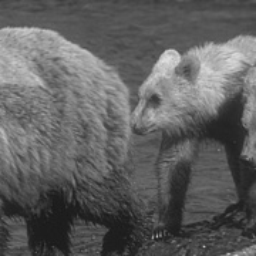

In [3]:

if torch.cuda.is_available():
    device = torch.device("cuda")          # a CUDA device object
    print(f"Using CUDA device: {torch.cuda.get_device_name(0)}")
else:
    device = torch.device("cpu")
    print("CUDA is not available. Using CPU instead.")
    

training_images_folder = "Train400"
testing_images_folder = "test68"


transformer = transforms.Compose([
    transforms.Resize((256,256)),
    transforms.ToTensor(),
])

training_dataset = DataSet(training_images_folder,transform = transformer)



print("First tensor after transform:")
print(training_dataset[0])
print("First tensor shape: ")
print(training_dataset[0].shape)
min_value = training_dataset[0].min()
max_value = training_dataset[0].max()
print(f'Min Pixel: {min_value}, Max Pixel: {max_value}')

print("\nFirst Training Image after preprocessing: ")
image_pil = TF.to_pil_image(training_dataset[0])
display(image_pil)

In [4]:

#trainSize = 360, validationSize = 40, testSize = 68

testD = DataSet(testing_images_folder, transform = transformer)
trainD, valD = random_split(training_dataset, [int(0.9*len(training_dataset)), int(0.1*len(training_dataset))])
train_load = DataLoader(trainD, batch_size=15,shuffle=True)
test_load = DataLoader(testD, batch_size=15,shuffle=True)
val_load = DataLoader(valD, batch_size=15,shuffle=True)


In [5]:
#finished pre processing


In [6]:

#for training, we have these variables set up ahead of itme
model = UNet_Denoise().to(device)

dataset_size = 400
learning_rate = 0.001
loss_fn = nn.MSELoss()  # Mean Squared Error loss
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)  # Adam optimizer
epochs = 10
mean = 0
variance = 15/255

#lists for graphing later

#each value in these lists is for a single epoch
training_loss = []
validation_loss = []
ssim_on = []#we are going to compare ORIGINAL vs NOISY which is going to be bad
ssim_oo = []# versus, ORIGINAL vs OUTPUT, which should be a lot more simikar
psnr_on = []
psnr_oo = []

In [8]:
for ep in range(epochs):
    model.train()
    
    # Variables to track loss and metrics for each epoch
    train_loss = 0
    val_loss = 0
    ssim_noisy_total = 0
    ssim_output_total = 0
    psnr_noisy_total = 0
    psnr_output_total = 0
    
    num_batches_train = 0
    num_batches_val = 0
    num_samples_total = 0
    
    # Training loop
    for batch_idx, images in enumerate(train_load):
        clean_images = images.to(device)
        model_input = clean_images + (torch.randn_like(clean_images)*variance + mean)
        
        optimizer.zero_grad()
        outputs = model(model_input)
        loss = loss_fn(outputs, clean_images)
        loss.backward()
        optimizer.step()
        
        train_loss += loss.item()
        num_batches_train += 1
        
    # Validation loop
    model.eval()
    with torch.no_grad():
        for batch_idx, images in enumerate(val_load):
            clean_images = images.to(device)
            model_input = clean_images + (torch.randn_like(clean_images) * variance + mean)
            outputs = model(model_input)
            val_loss += loss_fn(outputs, clean_images).item()
            num_batches_val += 1
                
            for original, noisy, output in zip(clean_images, model_input, outputs):
                original = original.squeeze().detach().cpu().numpy()  # Extract 256x256 part
                noisy = noisy.squeeze().detach().cpu().numpy()  # Extract 256x256 part
                output = output.squeeze().detach().cpu().numpy()  # Extract 256x256 part

                # Update SSIM and PSNR totals
                ssim_noisy_total += ssim(original, noisy, data_range=1.0)# we are on a data_range of [0,1]
                ssim_output_total += ssim(original, output, data_range=1.0)
                psnr_noisy_total += PSNR(mse(original, noisy), original.max())
                psnr_output_total += PSNR(mse(original, output), original.max())
                num_samples_total += 1

    
    # Calculate averages
    train_loss_avg = train_loss / num_batches_train if num_batches_train > 0 else 0
    val_loss_avg = val_loss / num_batches_val if num_batches_val > 0 else 0
    ssim_noisy_avg = ssim_noisy_total / num_samples_total if num_samples_total > 0 else 0
    ssim_output_avg = ssim_output_total / num_samples_total if num_samples_total > 0 else 0
    psnr_noisy_avg = psnr_noisy_total / num_samples_total if num_samples_total > 0 else 0
    psnr_output_avg = psnr_output_total / num_samples_total if num_samples_total > 0 else 0
    
    training_loss.append(train_loss_avg)# documenting for graphing; each element represents an epoch of data
    validation_loss.append(val_loss_avg)
    ssim_on.append(ssim_noisy_avg)
    ssim_oo.append(ssim_output_avg)
    psnr_on.append(psnr_noisy_avg)
    psnr_oo.append(psnr_output_avg)
    
    # Print results
    print(f"Epoch {ep+1}/{epochs}, Training Loss: {train_loss_avg:.4f}, Validation Loss: {val_loss_avg:.4f},"
          f" Avg SSIM of noisy images: {ssim_noisy_avg:.4f}, Avg SSIM of output images: {ssim_output_avg:.4f},"
          f" Avg PSNR of noisy images: {psnr_noisy_avg:.4f}, Avg PSNR of output images: {psnr_output_avg:.4f}")

    torch.save(model.state_dict(), 'unet_model_weights_10epochs.pth')#saving the weights for later use

KeyboardInterrupt: 

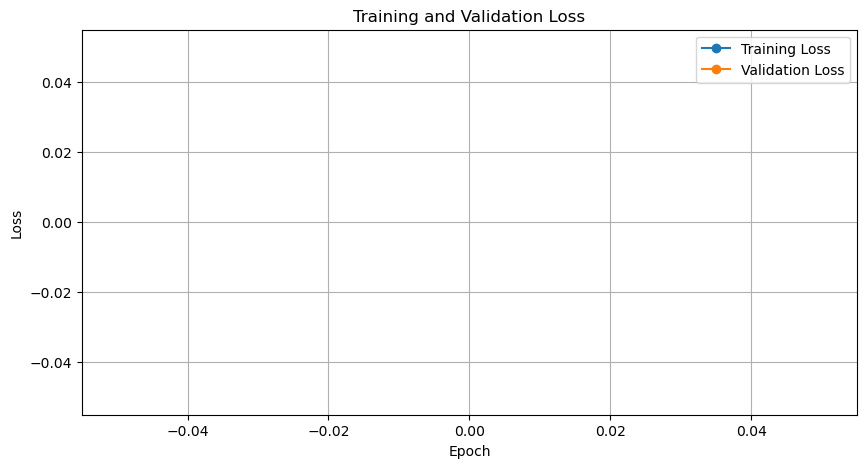

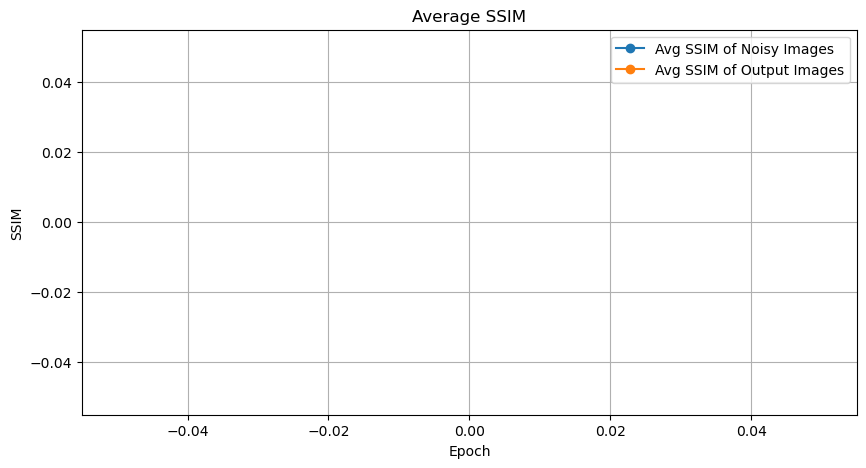

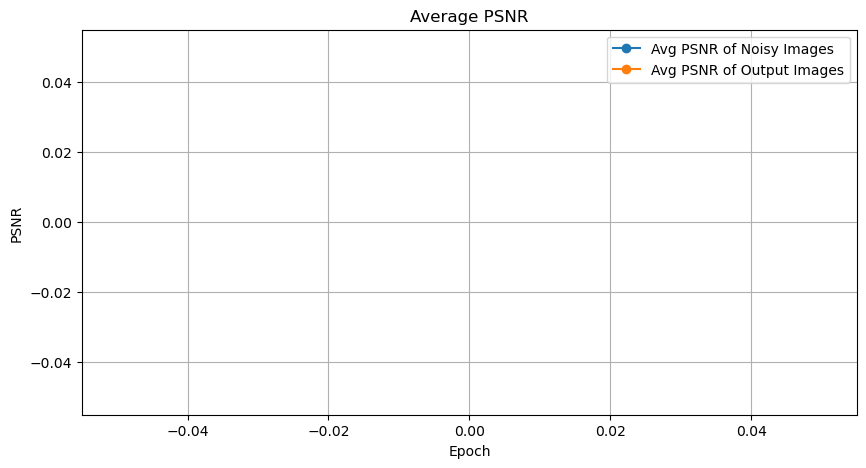

In [9]:
#graphing for PSNR, SSIM and Loss

model.load_state_dict(torch.load('unet_model_weights_10epochs.pth'))

# Plot training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(training_loss, label='Training Loss', marker='o')
plt.plot(validation_loss, label='Validation Loss', marker='o')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

# Plot SSIM
plt.figure(figsize=(10, 5))
plt.plot(ssim_on, label='Avg SSIM of Noisy Images', marker='o')
plt.plot(ssim_oo, label='Avg SSIM of Output Images', marker='o')
plt.title('Average SSIM')
plt.xlabel('Epoch')
plt.ylabel('SSIM')
plt.legend()
plt.grid(True)
plt.show()

# Plot PSNR
plt.figure(figsize=(10, 5))
plt.plot(psnr_on, label='Avg PSNR of Noisy Images', marker='o')
plt.plot(psnr_oo, label='Avg PSNR of Output Images', marker='o')
plt.title('Average PSNR')
plt.xlabel('Epoch')
plt.ylabel('PSNR')
plt.legend()
plt.grid(True)
plt.show()


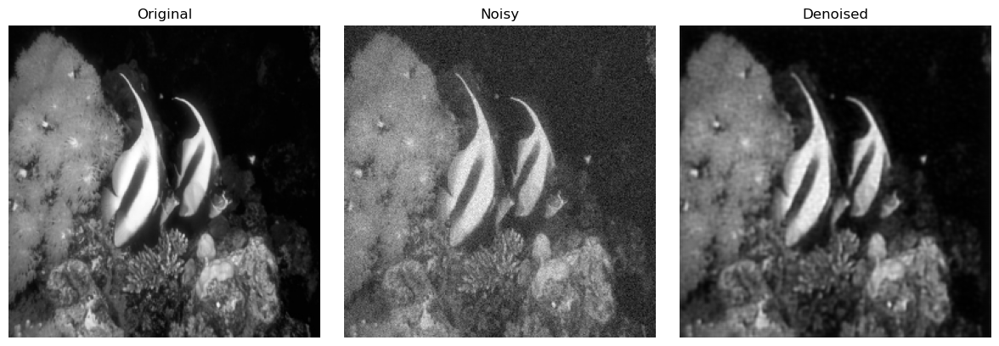

Image 1 in Batch 1, Test Loss: 0.00119788758456707




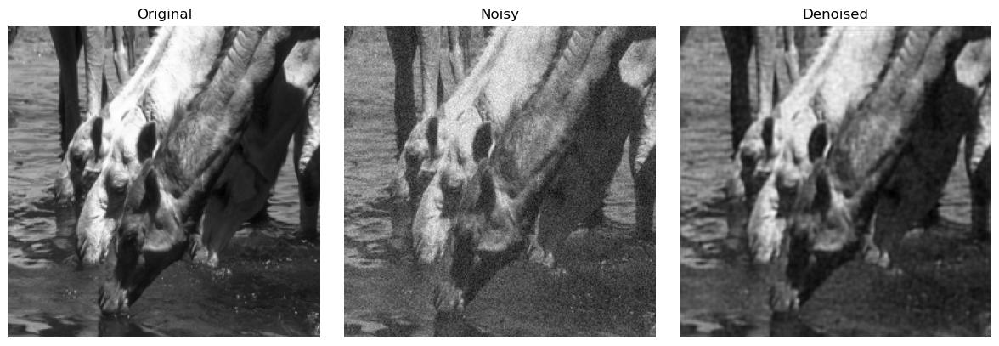

Image 2 in Batch 1, Test Loss: 0.0012002219446003437




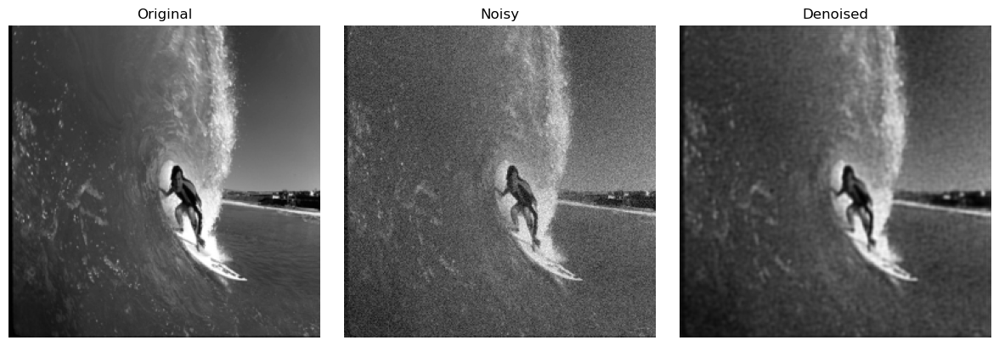

Image 3 in Batch 1, Test Loss: 0.001008196733891964




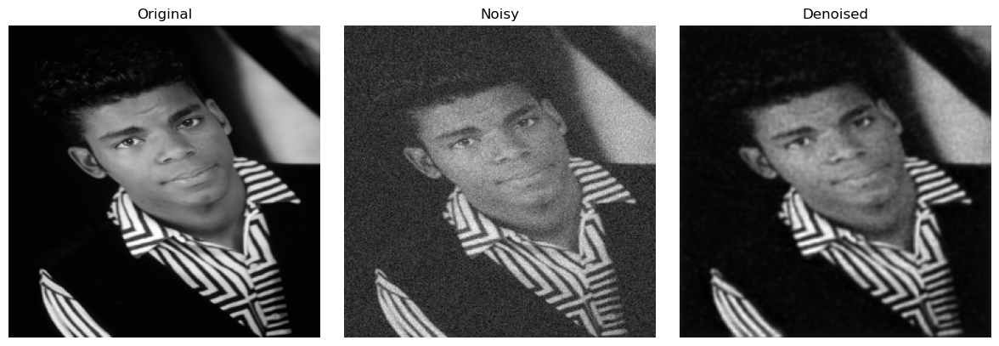

Image 4 in Batch 1, Test Loss: 0.001067012082785368




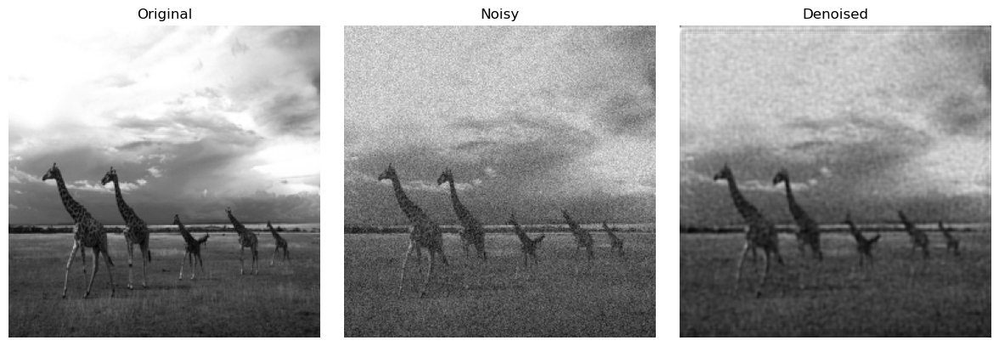

Image 5 in Batch 1, Test Loss: 0.0007742461748421192




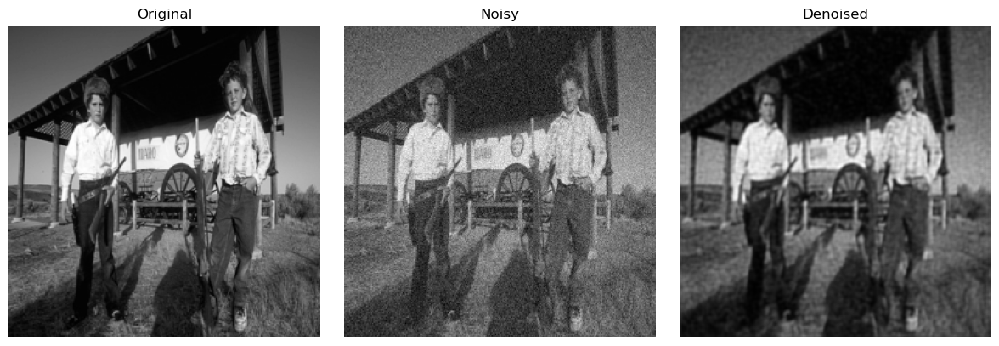

Image 6 in Batch 1, Test Loss: 0.0015267771668732166




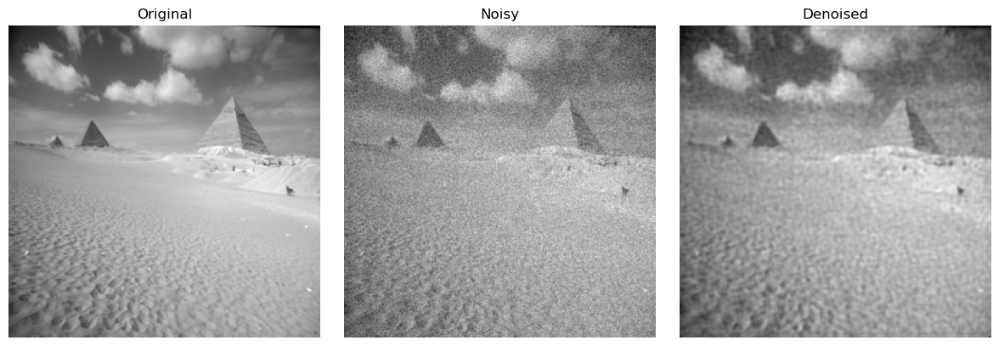

Image 7 in Batch 1, Test Loss: 0.0007099686772562563




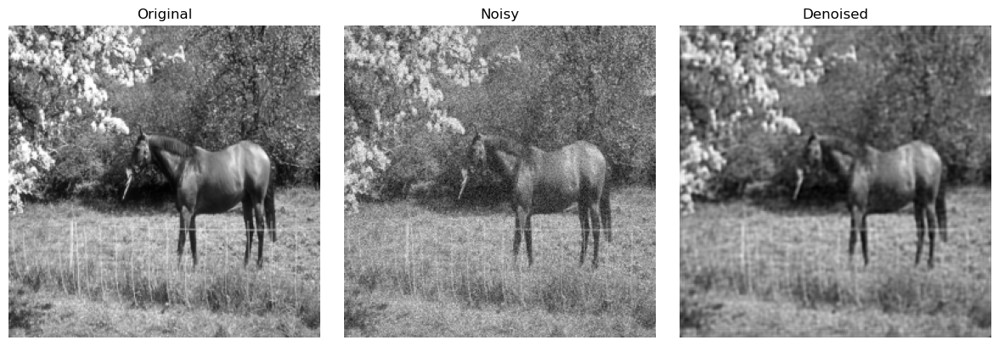

Image 8 in Batch 1, Test Loss: 0.00275974627584219




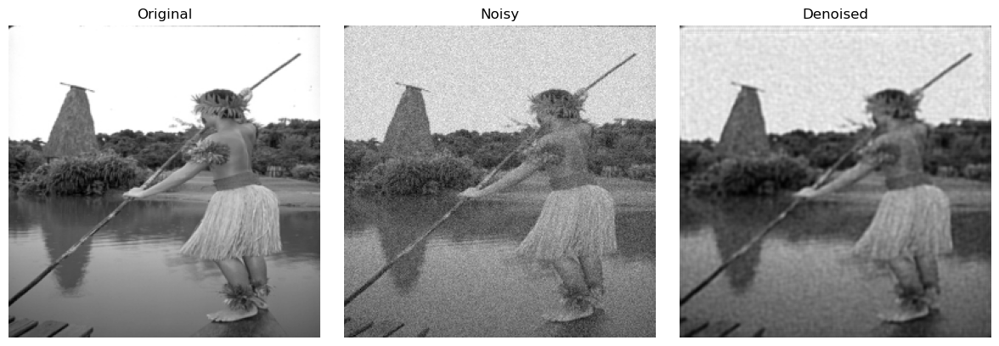

Image 9 in Batch 1, Test Loss: 0.0012227827683091164




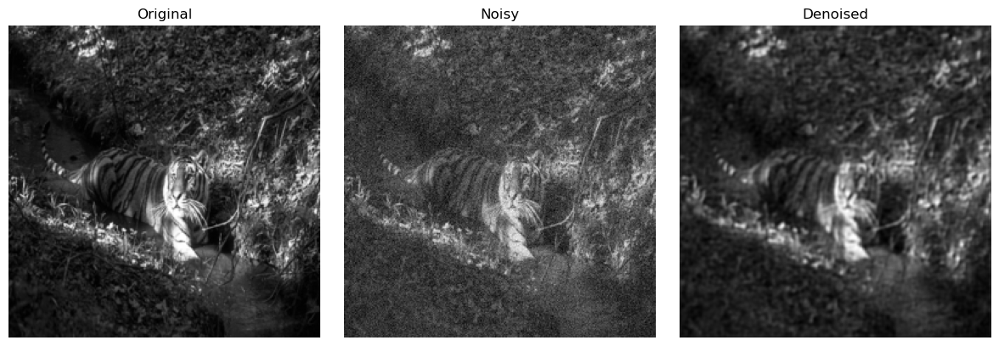

Image 10 in Batch 1, Test Loss: 0.002275802893564105




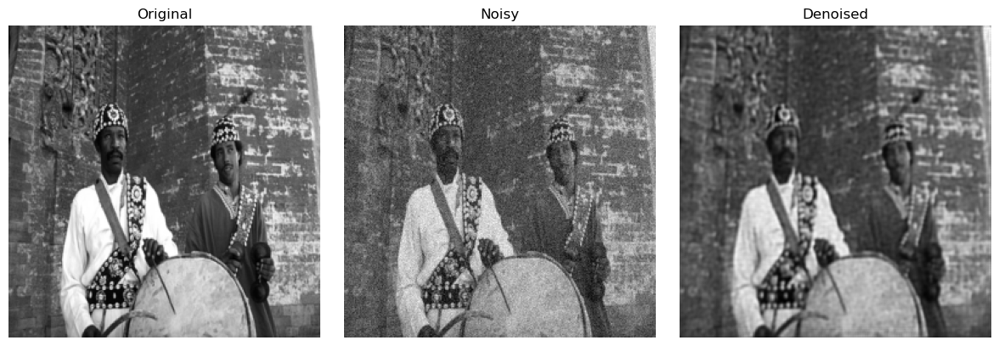

Image 11 in Batch 1, Test Loss: 0.0027416422963142395




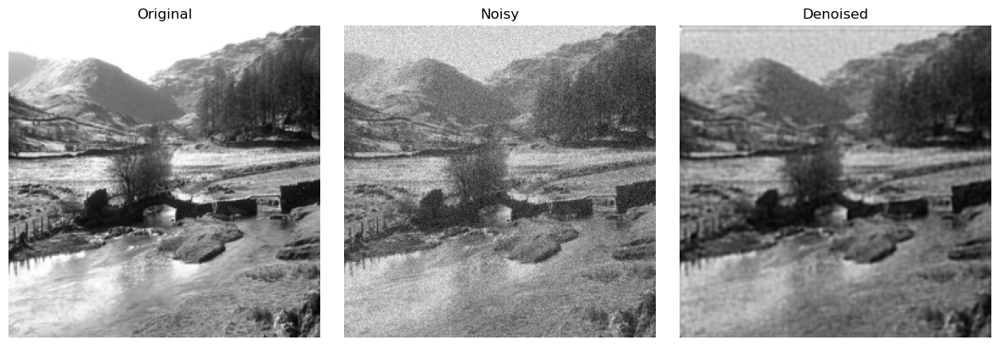

Image 12 in Batch 1, Test Loss: 0.0016245219158008695




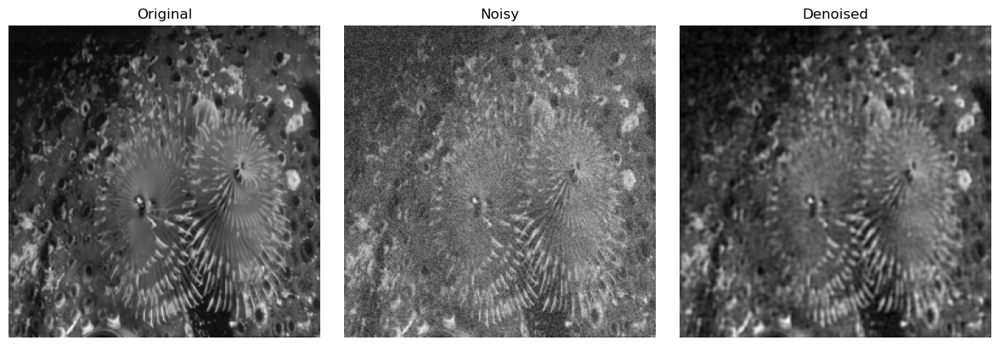

Image 13 in Batch 1, Test Loss: 0.0013210148317739367




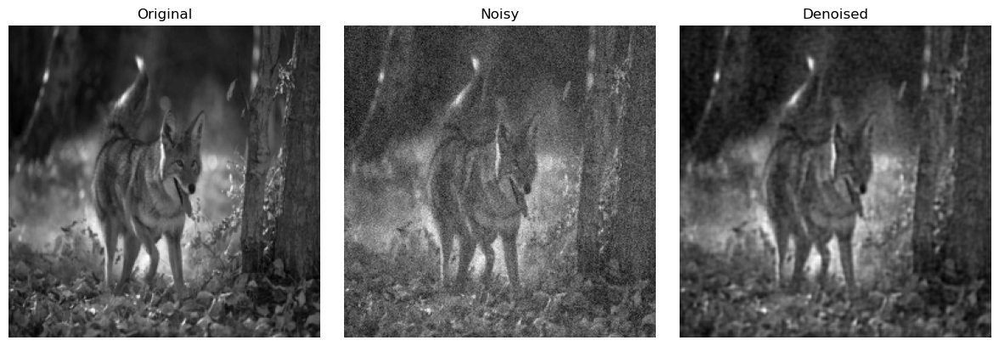

Image 14 in Batch 1, Test Loss: 0.0009533937554806471




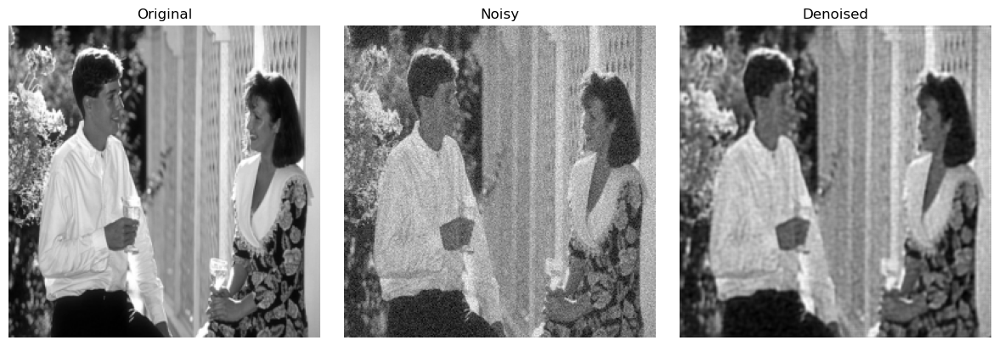

Image 15 in Batch 1, Test Loss: 0.0014985438901931047




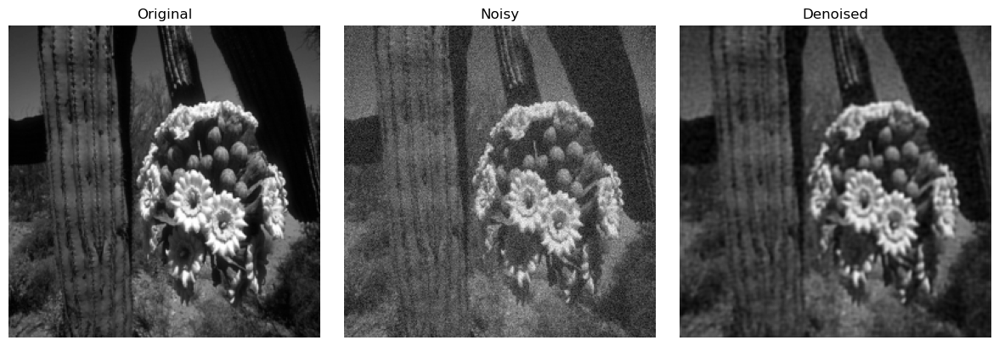

Image 1 in Batch 2, Test Loss: 0.0013342066667973995




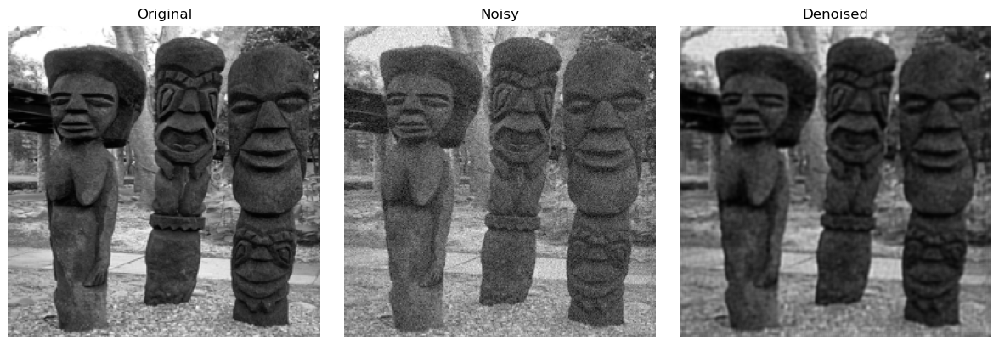

Image 2 in Batch 2, Test Loss: 0.0020261514000594616




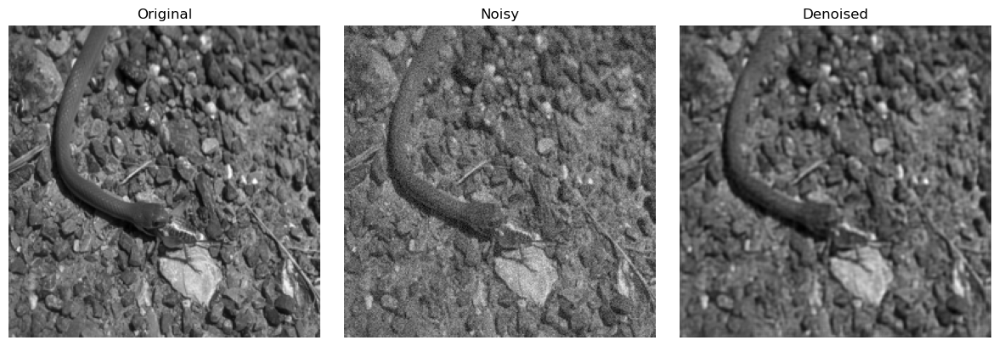

Image 3 in Batch 2, Test Loss: 0.0018534831469878554




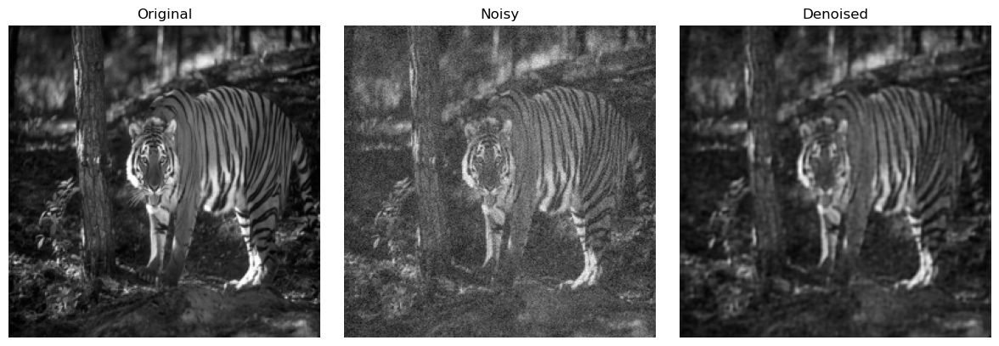

Image 4 in Batch 2, Test Loss: 0.001566916354931891




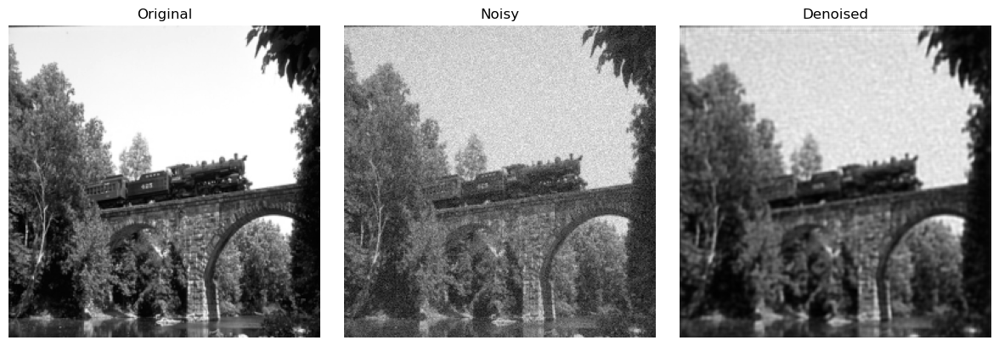

Image 5 in Batch 2, Test Loss: 0.002527005271986127




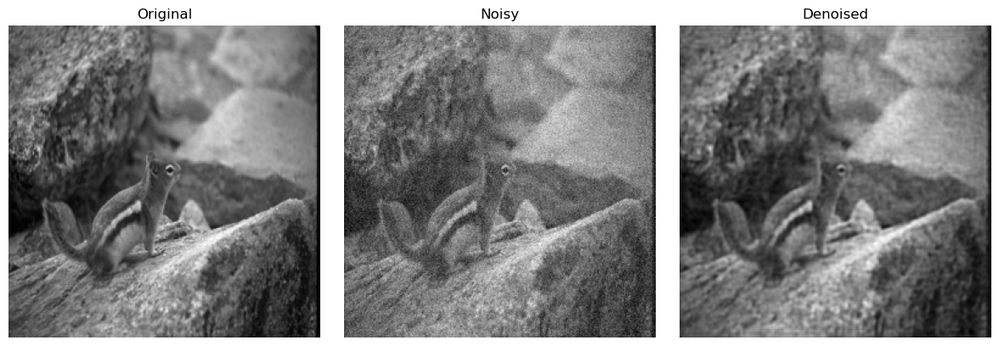

Image 6 in Batch 2, Test Loss: 0.0009334877831861377




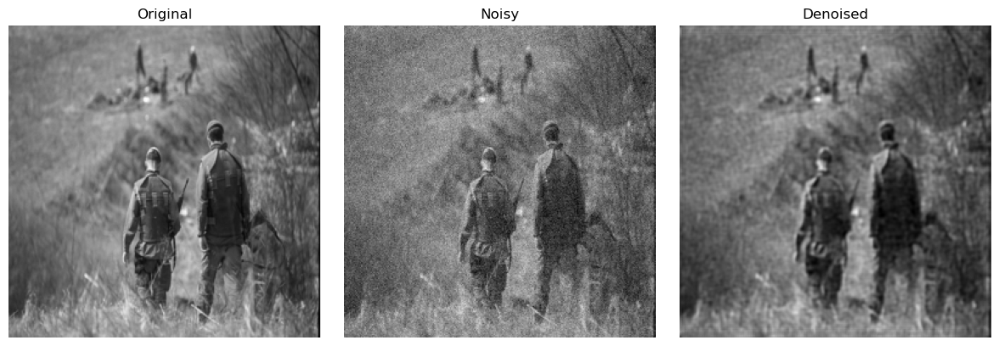

Image 7 in Batch 2, Test Loss: 0.0010692001087591052




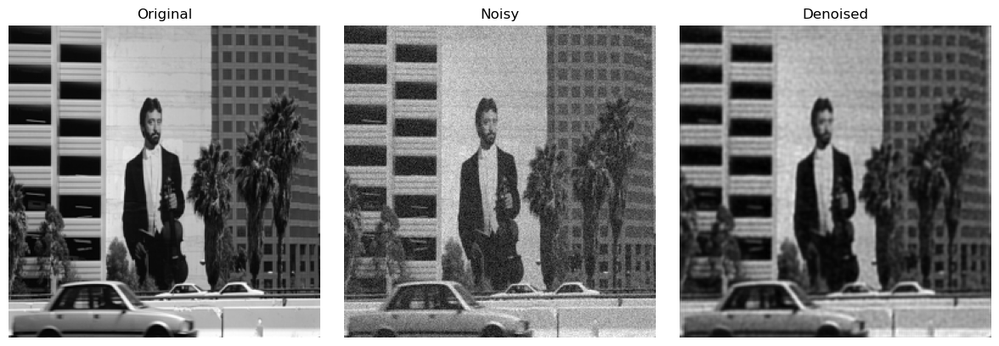

Image 8 in Batch 2, Test Loss: 0.0024404376745224




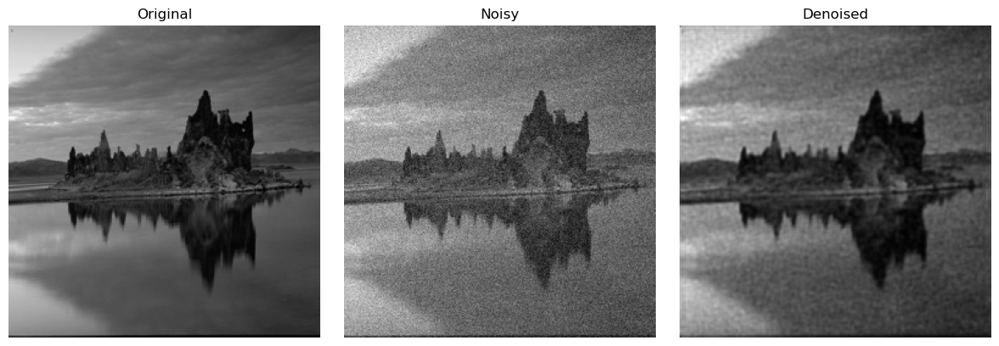

Image 9 in Batch 2, Test Loss: 0.000705713639035821




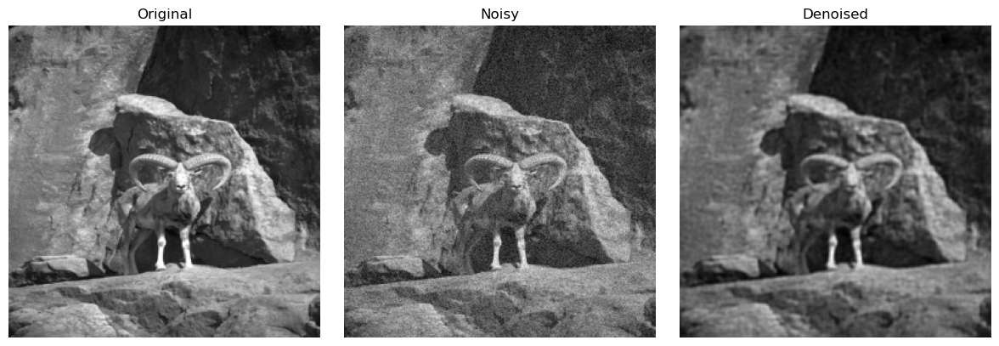

Image 10 in Batch 2, Test Loss: 0.0014862732496112585




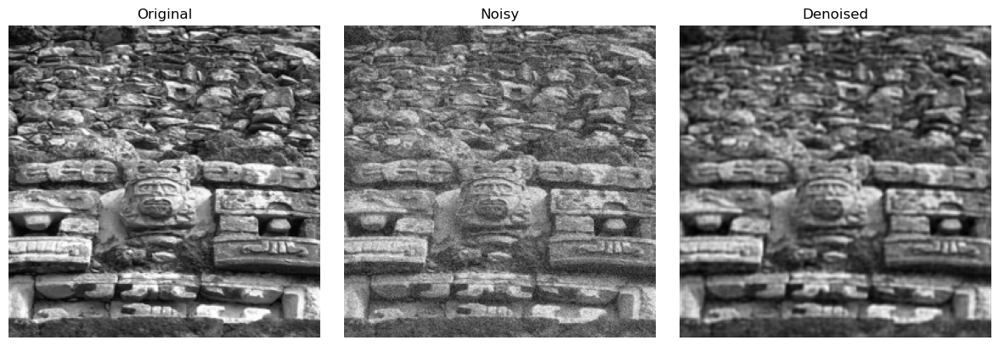

Image 11 in Batch 2, Test Loss: 0.0037758953403681517




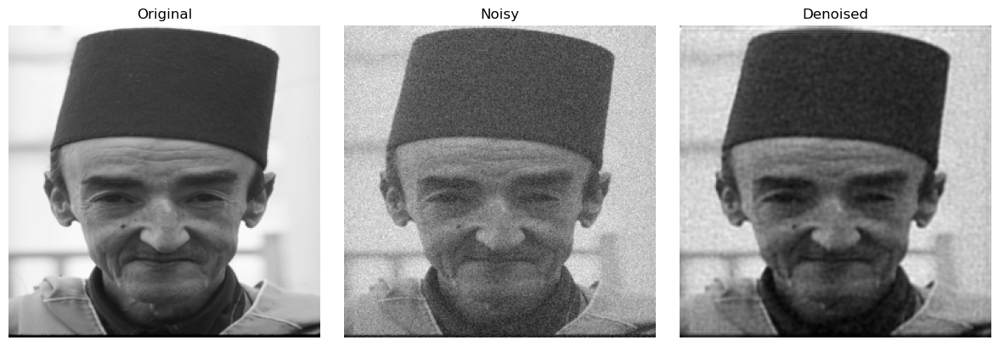

Image 12 in Batch 2, Test Loss: 0.0009502042084932327




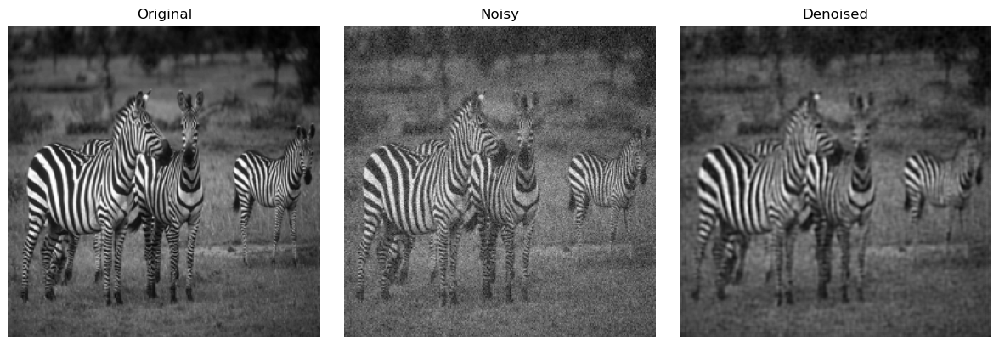

Image 13 in Batch 2, Test Loss: 0.0028372122906148434




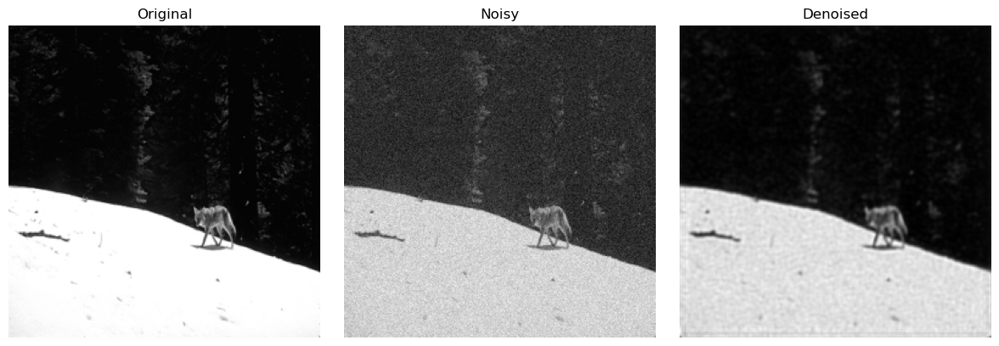

Image 14 in Batch 2, Test Loss: 0.0008711745031177998




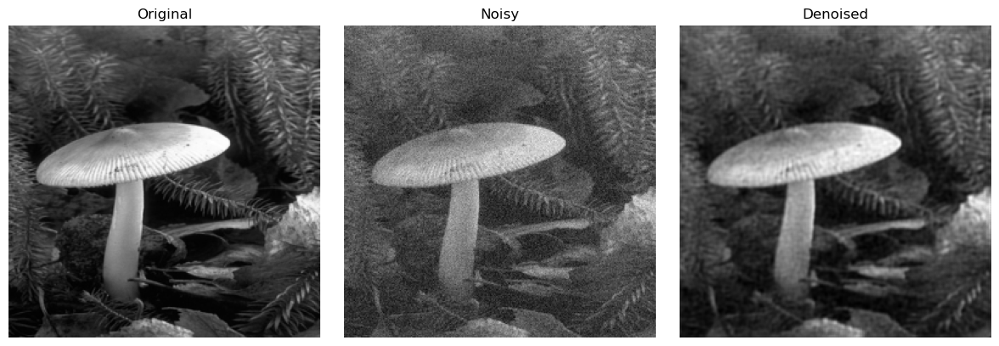

Image 15 in Batch 2, Test Loss: 0.0011664750054478645




PermissionError: [Errno 13] Permission denied: 'test68\\0'

In [15]:
# testing data
model.eval()
print("\n")

with torch.no_grad():  # Disable gradient computation
    
    for idx, images in enumerate(test_load):
        clean_images = images.to(device)  # original
        model_input = clean_images + (torch.randn_like(clean_images) * variance + mean)  # noisy image
        outputs = model(model_input)  # denoised image

        for i, (original, noisy, output) in enumerate(zip(clean_images, model_input, outputs)):
            test_loss = loss_fn(output, original.to(device))  # Compute loss for each image
            
            # Convert tensors to numpy arrays
            original_np = original.cpu().numpy()
            noisy_np = noisy.cpu().numpy()
            output_np = output.cpu().numpy()
            
            # Create a figure with subplots
            fig, axes = plt.subplots(1, 3, figsize=(12, 4))
            
            # Display original image
            axes[0].imshow(original_np.squeeze(), cmap='gray')
            axes[0].set_title('Original')
            axes[0].axis('off')
            
            # Display noisy image
            axes[1].imshow(noisy_np.squeeze(), cmap='gray')
            axes[1].set_title('Noisy')
            axes[1].axis('off')
            
            # Display denoised image
            axes[2].imshow(output_np.squeeze(), cmap='gray')
            axes[2].set_title('Denoised')
            axes[2].axis('off')
            
            # Adjust layout to prevent overlapping
            plt.tight_layout()
            
            # Show the plot
            plt.show()
            print(f"Image {i+1} in Batch {idx+1}, Test Loss: {test_loss.item()}")
            print("\n")

In [37]:

# Usage example
# image = load_image() # Load your image here
# original, blurred = blur(image)

# My implementation of PnP_Fast IST Algorithm for debluring
def generate_gaussian_filter(sigma: int | float, filter_shape: list | tuple | None):
    # 'sigma' is the standard deviation of the gaussian distribution

    m, n = filter_shape
    m_half = m // 2
    n_half = n // 2

    # initializing the filter
    gaussian_filter = np.zeros((m, n), np.float32)

    # generating the filter
    for y in range(-m_half, m_half + 1):
        for x in range(-n_half, n_half + 1):
            normal = 1 / (2.0 * np.pi * sigma**2.0)
            exp_term = np.exp(-(x**2.0 + y**2.0) / (2.0 * sigma**2.0))
            gaussian_filter[y+m_half, x+n_half] = normal * exp_term
    
    return gaussian_filter
            
def blur(image):
    
    transformer = transforms.Compose([
        transforms.Grayscale(num_output_channels=1),
        transforms.Resize((256,256)),
        transforms.ToTensor(),
    ])
    
    image_tensor = transformer(image).unsqueeze(0) #1,1,256,256
    
    # Define a 5x5 blur kernel
    _5x5_blur = generate_gaussian_filter(1,(5,5))
    
    _5x5_tensor = torch.tensor(_5x5_blur, dtype=torch.float32).view(1, 1, 5, 5)  # Convert to PyTorch tensor and reshape
    
    # Apply the convolution operation to blur the image
    blurred_tensor = F.conv2d(image_tensor, _5x5_tensor, padding=2)
    
    # Add Gaussian noise to the blurred image
    blurred_img = blurred_tensor.squeeze()
    blur_n_noise = blurred_img + (15/255) * torch.randn_like(blurred_img)
    
    blurred_img_np = blur_n_noise.numpy()

    # Plot the images
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1) 
    plt.imshow(image, cmap='gray')  
    plt.title('Original Image')  
    plt.axis('off') 
    
    plt.subplot(1, 2, 2) 
    plt.imshow(blurred_img_np, cmap='gray')
    plt.title('Blurred Image + Gaussian Noise')
    plt.axis('off')
    plt.show()
    
    return image, blurred_img_np

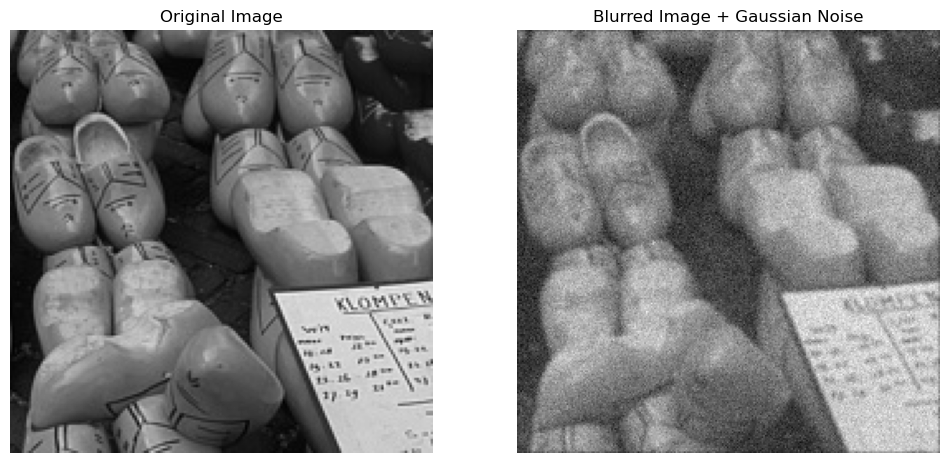

In [39]:
test_image = Image.open("Train400/test_033.png")

original,blurred=blur(test_image)

In [43]:

class Blur_Operator(nn.Module):
    # y = Ax + e
    """
    y is the noisy and blured image
    x is the reconstruction
    A is the blurring kernel used for the inverse problem
    e is the added white gaussian noise
    """
    def __init__(self, sigma = 1, size = 7):
        super(Blur_Operator, self).__init__()
        self.blur_kernel = generate_gaussian_filter(sigma,(size,size))
        
        
    def forward(self, x):
        #Ax
        y = F.conv2d(x,self.blur_kernel,padding=1)
        return y
    
    def transpose(self):
        t = torch.transpose(self.k,0,1)
        return t
        
    def gradient(self,x,y):
        # A^T(Ax-y)
        paren = self.forward(x) - y
        result = transpose * paren
        return result
        
    def loss(self,x,y): # not used but good to have
        return x - self.gradient(x,y)

In [45]:


def algo_pnp_fista(self,A,D,x0,y,lr=0.1,theta=0.3,iterations=10): #testing idk 
    x=x0
    s=s0
    
    for k in range(1,iterations+1):
        z = x - lr*A.gradient(x,y)
        sk = D.forward(z)
        x = (1-theta)*sk + theta*s
        s=sk
    return x